# **Under Water Image Enhacement Based on DIP Concepts**





***DIP Concepts Used In The Project***


---


1.   Image Enhancement
2.   Histogram Analysis (Understanding intensity distribution)
3.   Point Processing Techniques
     *     Contrast Stretching
     *     Histogram Equalization
4.   Spatial Domain Enhancement
5.   Filtering
     *     Linear Domain Filtering
     *     Non-Linear Domain Filtering
6.   Color Image Processing
7.   **Dark Channel Prior (DCP) Approach**




***Team Members***


---



*   COHNDSE232F-045        **K D R Silva**
*   COHNDSE232F-044        **S M A D V D Sammandapperuma**
*   COHNDSE232F-100        **K A I Perera**






In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import tensorflow as tf
from tensorflow.keras.losses import mse
from tensorflow.image import ssim

# Pre-Processing
**K A I Perera**

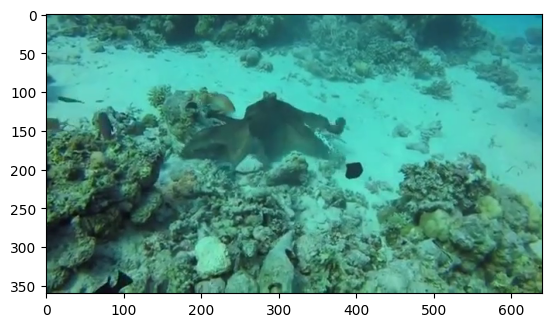

In [3]:
image = cv2.imread('inputimage07.png')
img = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
plt.imshow(img)

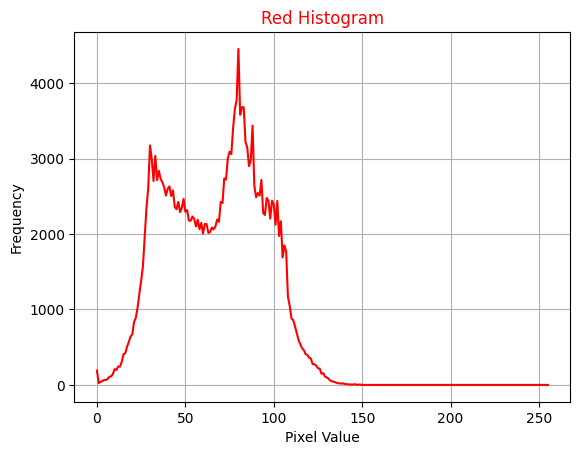

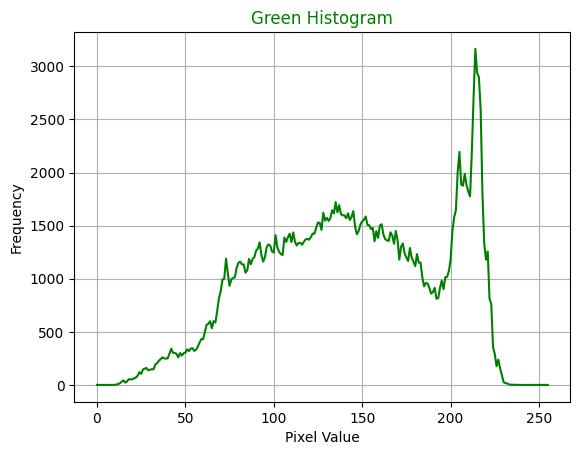

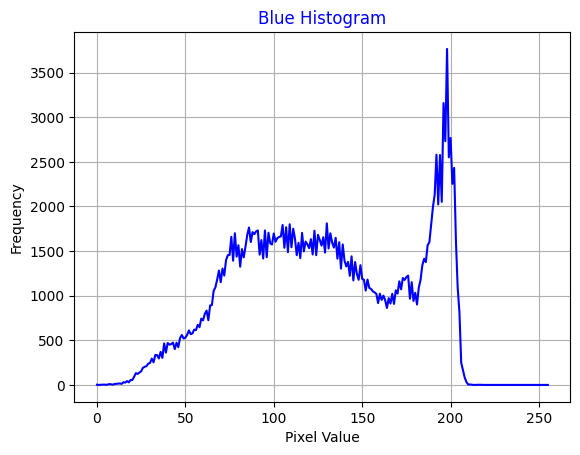

In [4]:
histo = cv2.calcHist([img],[0],None,[256],[0,256])
plt.plot(histo, color='r')
plt.title('Red Histogram', color='r')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

histo = cv2.calcHist([img],[1],None,[256],[0,256])
plt.plot(histo, color='g')
plt.title('Green Histogram', color='g')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

histo = cv2.calcHist([img],[2],None,[256],[0,256])
plt.plot(histo, color='b')
plt.title('Blue Histogram', color='b')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

***Insights***:  

**- The peak is at lower pixel values (around 0-50), indicating a significant amount of darker reds in the image.**

**- The red channel shows high frequency in the lower pixel value range, which suggests that the image contains many dark red tones, potentially due to the absorption of red light underwater.**

**-  The green channel has its peak around mid pixel values (approximately 50-150), which suggests that the image has a considerable amount of mid-tone green.**

**- The blue channel peaks around the mid pixel values (approximately 50-150) and has a significant frequency, suggesting a prominent presence of blue tones.**

**- The distribution of blue is broad, reflecting the underwater environment where blue light is less absorbed compared to red and green, making blue tones more prevalent..**


**bold text** - *italicized text*

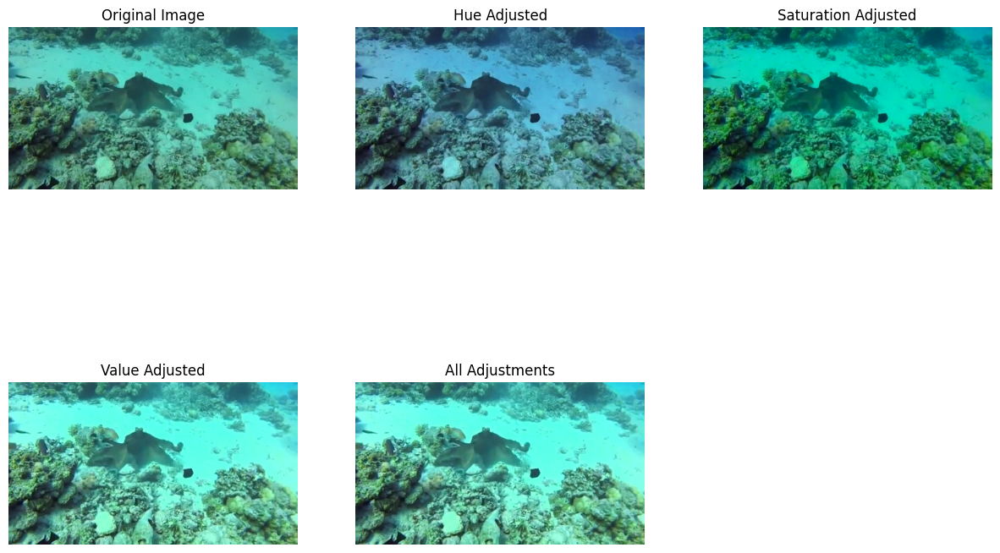

In [5]:
# Function to adjust hue
def adjust_hue(image, shift):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    img_hsv[:, :, 0] = (img_hsv[:, :, 0].astype(int) + shift) % 180
    return cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Function to adjust saturation
def adjust_saturation(image, scale):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    img_hsv[:, :, 1] = np.clip(img_hsv[:, :, 1].astype(float) * scale, 0, 255).astype(np.uint8)
    return cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Function to adjust vividness (brightness)
def adjust_value(image, scale):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    img_hsv[:, :, 2] = np.clip(img_hsv[:, :, 2].astype(float) * scale, 0, 255).astype(np.uint8)
    return cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

# Adjustments
hue_shift = 12  # shift hue by 10 degrees
saturation_scale = 1.8  # increase saturation by 20%
value_scale = 1.3  # increase brightness by 10%

# Apply adjustments
img_adjusted_hue = adjust_hue(img, hue_shift)
img_adjusted_saturation = adjust_saturation(img, saturation_scale)
img_adjusted_value = adjust_value(img, value_scale)

# Combine all adjustments (optional)
img_adjusted_all = adjust_hue(img_adjusted_saturation, hue_shift)
img_adjusted_all = adjust_value(img_adjusted_all, value_scale)

# Plotting the original and adjusted images
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.title('Original Image')
plt.imshow(img)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title('Hue Adjusted')
plt.imshow(img_adjusted_hue)
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title('Saturation Adjusted')
plt.imshow(img_adjusted_saturation)
plt.axis('off')

plt.subplot(2, 3, 4)
plt.title('Value Adjusted')
plt.imshow(img_adjusted_value)
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title('All Adjustments')
plt.imshow(img_adjusted_all)
plt.axis('off')

plt.show()

# DCP Teqniques

**K D R Silva & S M V Deshan**

**Patching & Dark Channel Calculation** - *K D R Silva*



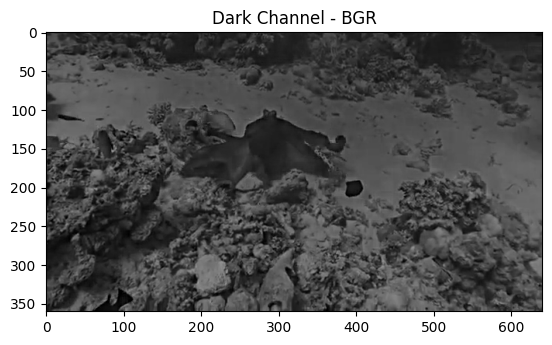

In [6]:
def dcp(img, patch_size=15):
    dark_channel = np.zeros_like(img[:, :, 0])
    for y in range(0, img.shape[0], patch_size):
        for x in range(0, img.shape[1], patch_size):
            # Extract patch (handle edge cases)
            patch = img[max(0, y):min(y + patch_size, img.shape[0]),
                        max(0, x):min(x + patch_size, img.shape[1])]
            # Calculate minimum intensity value for each pixel across the RGB channels
            patch_min = np.min(patch, axis=2)
            # Fill dark channel with patch minimum (handle edge cases)
            dark_channel[max(0, y):min(y + patch_size, img.shape[0]),
                         max(0, x):min(x + patch_size, img.shape[1])] = patch_min
    return dark_channel


dark_channel = dcp(img)

plt.imshow(cv2.cvtColor(dark_channel,cv2.COLOR_RGB2BGR))
plt.title('Dark Channel - BGR')
plt.show()

**Estimation of Atmospheric Light** - *K D R Silva*

In [7]:
def estimate_atmospheric_light(img, dark_channel, top_percent=0.001):
    num_pixels = np.prod(img.shape[:2])
    num_brightest = int(num_pixels * top_percent)
    indices = np.argpartition(dark_channel.flatten(), -num_brightest)[-num_brightest:]
    brightest_pixels = img.reshape(-1, 3)[indices]
    atmospheric_light = np.mean(brightest_pixels, axis=0)
    return atmospheric_light

**Calculation of Transmition Map** - *K D R Silva*

In [8]:
def transmission_map(img, atmos_light, omega=0.6):
    normalized_img = img.astype(np.float32) / atmos_light
    transmission = 1 - omega * np.min(normalized_img, axis=2)
    return transmission

**Refine Transmission Map** - *S M A D V DESHAN*

In [9]:
def refine_transmission_map(img, transmission, radius=60, eps=0.0001):
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32) / 255 # convert the GRAYSCALE img to floating point fomate and normalize it to range[0,1] by diving 255
    refined_transmission = guided_filter(gray_img, transmission, radius, eps) #apply guided filter to the transmission map.
    return refined_transmission

**Refine Transmission Map - Guided Filter** - S M A D V Deshan





In [10]:
def guided_filter(I, p, r, eps): #I=grayscale img, p=transmission map, r=radius
    mean_I = cv2.boxFilter(I, cv2.CV_64F, (r, r)) #CV_64F= output will be 64bit floating point img, (r,r)=defines the size of the kernel, boxfilter=use to get the mean of the img
    mean_p = cv2.boxFilter(p, cv2.CV_64F, (r, r)) #calculate the mean of the transmission map.
    mean_Ip = cv2.boxFilter(I * p, cv2.CV_64F, (r, r)) #calculate the mean of the graysclae img and the transmission map.
    cov_Ip = mean_Ip - mean_I * mean_p #calculate the covariance between the grayscale img and the transmission map.

    mean_II = cv2.boxFilter(I * I, cv2.CV_64F, (r, r)) #calculate the mean of the square of the grayscale img.
    var_I = mean_II - mean_I * mean_I  #calculate the variance of the grayscale img.

    a = cov_Ip / (var_I + eps)
    b = mean_p - a * mean_I

    mean_a = cv2.boxFilter(a, cv2.CV_64F, (r, r)) #calculate the mean of the a matrix.
    mean_b = cv2.boxFilter(b, cv2.CV_64F, (r, r)) #calculate the mean of the b matrix.

    q = mean_a * I + mean_b #cgetting refined version of transmission map using grayscale img.
    return q

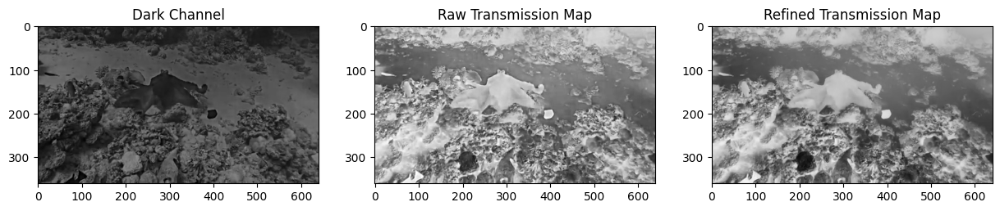

In [11]:
# Load your image
img = cv2.imread('inputimage07.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Dark Channel Prior
dark_channel = dcp(img)

# Estimate Atmospheric Light
atmospheric_light = estimate_atmospheric_light(img, dark_channel)

# Calculate Transmission Map
raw_transmission = transmission_map(img, atmospheric_light)

# Refine Transmission Map
refined_transmission = refine_transmission_map(img, raw_transmission)

# Display Results
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(dark_channel, cv2.COLOR_RGB2BGR))
plt.title('Dark Channel')

plt.subplot(1, 3, 2)
plt.imshow(raw_transmission, cmap='gray')
plt.title('Raw Transmission Map')

plt.subplot(1, 3, 3)
plt.imshow(refined_transmission, cmap='gray')
plt.title('Refined Transmission Map')

plt.show()

**Recover Image Radience** - K D R Silva

In [12]:
def recover_scene_radiance(img, transmission, atmos_light, t0=0.1):
    # Avoid division by zero
    transmission = np.maximum(transmission, t0)

    # Recover the scene radiance
    J = np.empty_like(img)
    for i in range(3):
        J[:, :, i] = (img[:, :, i] - atmos_light[i]) / transmission + atmos_light[i]

    # Clip the values to be in the range [0, 255]
    J = np.clip(J, 0, 255).astype(np.uint8)

    return J

**Adjusting Parameters For Better De-Hazed Image - Guided Filtering** - *K D R Silva*

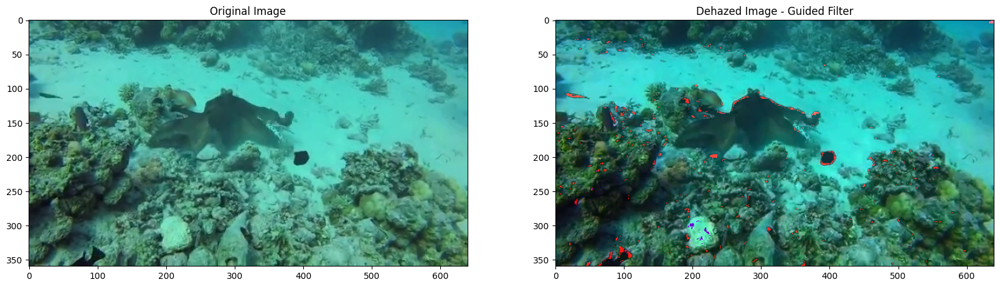

In [13]:
# Dark Channel Prior
dark_channel = dcp(img)

# Estimate Atmospheric Light
atmospheric_light = estimate_atmospheric_light(img, dark_channel)

# Calculate Transmission Map
raw_transmission = transmission_map(img, atmospheric_light)

# Refine Transmission Map
refined_transmission = refine_transmission_map(img, raw_transmission)

# Recover Scene Radiance
dehazed_img = recover_scene_radiance(img, refined_transmission, atmospheric_light)

# Display Results
plt.figure(figsize=(20, 10))

# Original Image
plt.subplot(1,2,1)
plt.imshow(img)
plt.title('Original Image')

# Dark Channel
'''plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(dark_channel, cv2.COLOR_RGB2BGR))
plt.title('Dark Channel')

# Refined Transmission Map
plt.subplot(2, 2, 3)
plt.imshow(refined_transmission, cmap='gray')
plt.title('Refined Transmission Map')'''

# Dehazed Image
plt.subplot(1,2,2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image - Guided Filter')

plt.show()

**Soft Matting Filtering** - *K D R Silva*

In [14]:
def soft_matting(img, transmission, radius=15, eps=1e-7):
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32) / 255
    refined_transmission = guided_filter(gray_img, transmission, radius, eps)
    return refined_transmission

Text(0.5, 1.0, 'Dehazed Image with Soft Matting')

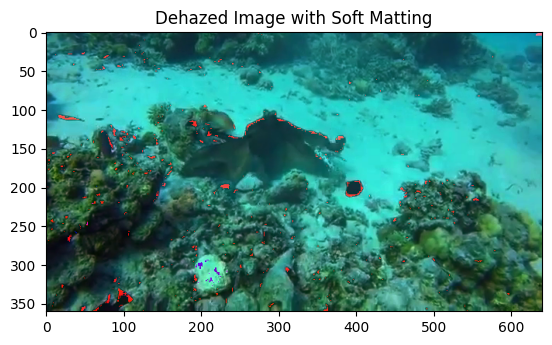

In [15]:
soft_refined_transmission = soft_matting(img, refined_transmission)
dehazed_img_soft_Matting = recover_scene_radiance(img, soft_refined_transmission, atmospheric_light)


plt.imshow(dehazed_img_soft_Matting)
plt.title('Dehazed Image with Soft Matting')

**Gaussian filter** - *S M A D V Deshan*

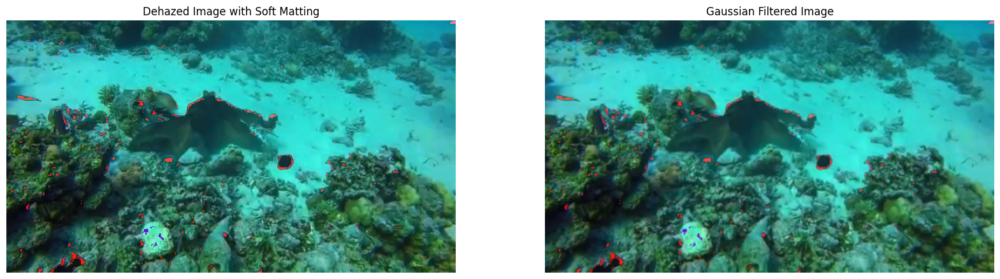

In [16]:
# Define kernel size and sigma for Gaussian blur
kernel_size = 3  # Smaller kernel size to avoid excessive blurring
sigma = 0.6  # Moderate sigma to reduce noise without noticeable blur

# Apply Gaussian blur
blurred_img = cv2.GaussianBlur(dehazed_img_soft_Matting, (kernel_size, kernel_size), sigma)

# Display the original dehazed image and the blurred image using matplotlib
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(dehazed_img_soft_Matting)
plt.title('Dehazed Image with Soft Matting')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(blurred_img)
plt.title('Gaussian Filtered Image')
plt.axis('off')

plt.show()

**Insights**


---

We can not apply for this to our main process due to the entire blure image. because we are trying to blure and smooth only for noise areas. but it applied for entire image and cannot apply gussain filter only for noise areas.


**PSNR & SSIM Evaluvation of DCP Filters** - *K D R Silva , K A I Perera*

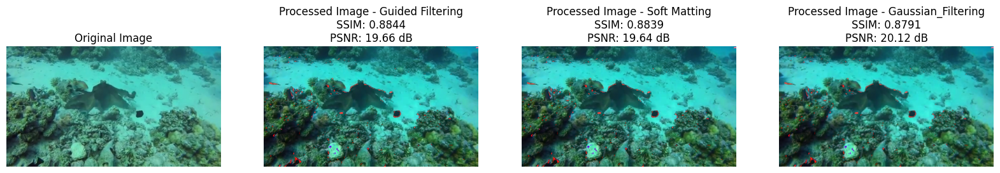

In [17]:
original_image = img
processed_image_guided = dehazed_img
processed_image_soft_matting = dehazed_img_soft_Matting
processed_image_gaussian = blurred_img


original_image = np.expand_dims(original_image, axis=0)
processed_image_guided = np.expand_dims(processed_image_guided, axis=0)
processed_image_soft_matting = np.expand_dims(processed_image_soft_matting, axis=0)
processed_image_gaussian = np.expand_dims(processed_image_gaussian, axis=0)


original_image_tensor = tf.convert_to_tensor(original_image, dtype=tf.float32)
processed_image_guided_tensor = tf.convert_to_tensor(processed_image_guided, dtype=tf.float32)
processed_image_soft_matting_tensor = tf.convert_to_tensor(processed_image_soft_matting, dtype=tf.float32)
processed_image_gaussian_tensor = tf.convert_to_tensor(processed_image_gaussian, dtype=tf.float32)


original_image_tensor /= 255.0
processed_image_guided_tensor /= 255.0
processed_image_soft_matting_tensor /= 255.0
processed_image_gaussian_tensor /= 255.0

# Calculate PSNR and SSIM for guided filtering
psnr_guided = tf.image.psnr(original_image_tensor, processed_image_guided_tensor, max_val=1.0)
ssim_guided = tf.image.ssim(original_image_tensor, processed_image_guided_tensor, max_val=1.0)

# Calculate PSNR and SSIM for soft matting
psnr_soft_matting = tf.image.psnr(original_image_tensor, processed_image_soft_matting_tensor, max_val=1.0)
ssim_soft_matting = tf.image.ssim(original_image_tensor, processed_image_soft_matting_tensor, max_val=1.0)

# Calculate PSNR and SSIM for Gaussian filtering
psnr_gaussian = tf.image.psnr(original_image_tensor, processed_image_gaussian_tensor, max_val=1.0)
ssim_gaussian = tf.image.ssim(original_image_tensor, processed_image_gaussian_tensor, max_val=1.0)

# Print the PSNR and SSIM values
psnr_title_guided = f"PSNR: {psnr_guided.numpy()[0]:.2f} dB"
ssim_title_guided = f"SSIM: {ssim_guided.numpy()[0]:.4f}"

psnr_title_soft_matting = f"PSNR: {psnr_soft_matting.numpy()[0]:.2f} dB"
ssim_title_soft_matting = f"SSIM: {ssim_soft_matting.numpy()[0]:.4f}"

psnr_title_gaussian = f"PSNR: {psnr_gaussian.numpy()[0]:.2f} dB"
ssim_title_gaussian = f"SSIM: {ssim_gaussian.numpy()[0]:.4f}"

# Plot the images with titles
plt.figure(figsize=(20, 10))

plt.subplot(141)
plt.title('Original Image')
plt.imshow(original_image[0].astype(np.uint8))
plt.axis('off')

plt.subplot(142)
plt.title('Processed Image - Guided Filtering\n' + ssim_title_guided + '\n' + psnr_title_guided)
plt.imshow(processed_image_guided[0].astype(np.uint8))
plt.axis('off')

plt.subplot(143)
plt.title('Processed Image - Soft Matting\n' + ssim_title_soft_matting + '\n' + psnr_title_soft_matting)
plt.imshow(processed_image_soft_matting[0].astype(np.uint8))
plt.axis('off')

plt.subplot(144)
plt.title('Processed Image - Gaussian_Filtering\n' + ssim_title_gaussian + '\n' + psnr_title_gaussian)
plt.imshow(processed_image_gaussian[0].astype(np.uint8))
plt.axis('off')

plt.show()

**Insights**

***SSIM***

- A higher SSIM value like 0.8361 for the soft matting filtered indicates that the brightness levels in the soft matting image are very close to the original image. SSIM measures the luminance similarity which are brightness levels and shadow levels. So in here this SSIM value reflects how well brightness levels  and darkness managed in the processed image providing a more natural look.

- High SSIM value also suggests that the contrast levels in the soft matting image are well preserved. SSIM evaluates contrast similarity by comparing the variance in pixel intensities. Higher contrast similarity mean that the color intensities between the pixels are accurately maintained ensuring light and dark regions are preserved which is crucial for maintaining image details and textures.

-  SSIM assesses the structural similarities by comparing the spatial relationships of pixels. Higher SSIM value indicates that essential features such as edges, patterns are well maintained during the enhancement process which is important for visual quality. And also it shows that the spatial arrangements of pixels in the processed image closely matches the original image.

- In this enhancement process our main goal is to remove haze. Effective haze removal enhance visibility and contrast levels which should gives a higher SSIM number like 0.8361 which means that the processed image becomes more structurally similar to original image. The higher SSIM value indicates that the haze has been reduced without compromising the images structural integrity.

***PSNR***

- A higher PSNR value like this means that the processed soft matting image has a lower noise level and also preserved most of original image details textures. A higher PSNR value suggest that the difference between original and original image are minor implying effective noise reduction.

- A higher PSNR value near  signifies that the pixel values in the soft matting image closely match those in original image ensuring that the details are not lost during the enhancement process such as textures, edges and small features that are crucial for visual quality of underwater images.

- The PSNR value provides a indirect evidence of effective haze removal. A higher PSNR means that the soft matting image has few differentials with the original image yet suggesting that the haze removal process has worked during the enhancement process. Haze removal aims to enhance visibility and contrast levels. So this PSNR data show that the haze has been effectively removed leading to  clearer and more visually appealing underwater image.

- PSNR Value is widely used to measure the overall image quality of a image. With a higher PSNR value indicating better image quality of the soft matting image. A value around 18db is considered acceptable especially for challenging environments like this.

**White Balancing & Color Restoration** - *K D R Silva , S M A D V Deshan*

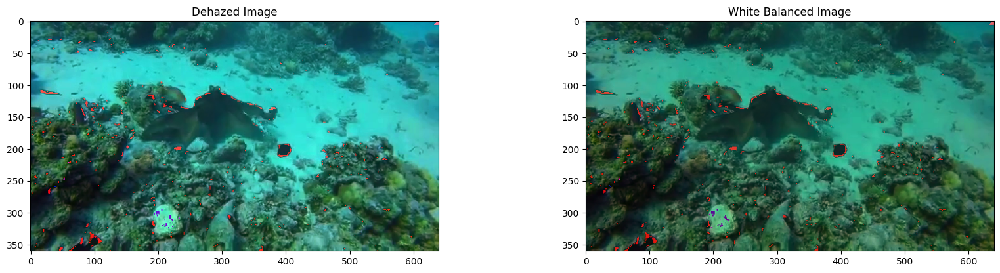

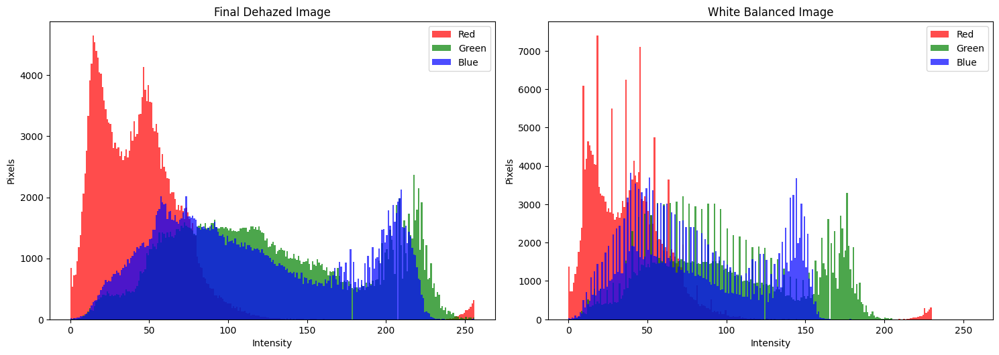

In [18]:
final_dehazed_image = dehazed_img_soft_Matting

scale_r = 0.9  # adjust these factors based on visual inspection
scale_g = 0.8
scale_b = 0.7

# Apply the scaling factors
white_balanced_image = final_dehazed_image.copy()
white_balanced_image[:, :, 0] = final_dehazed_image[:, :, 0] * scale_r
white_balanced_image[:, :, 1] = final_dehazed_image[:, :, 1] * scale_g
white_balanced_image[:, :, 2] = final_dehazed_image[:, :, 2] * scale_b

# Clip the values to stay within valid range [0, 255]
white_balanced_image = np.clip(white_balanced_image, 0, 255).astype(np.uint8)


# Plot the original and white balanced images
plt.figure(figsize=(20, 10))
plt.subplot(2, 2, 1)
plt.title('Dehazed Image')
plt.imshow(final_dehazed_image)

plt.subplot(2, 2, 2)
plt.title('White Balanced Image')
plt.imshow(white_balanced_image)
plt.show()

plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 3)
# Plot histograms for each channel separately
plt.hist(final_dehazed_image[:,:,0].ravel(), bins=256, range=(0, 256), color='red', alpha=0.7, label='Red')
plt.hist(final_dehazed_image[:,:,1].ravel(), bins=256, range=(0, 256), color='green', alpha=0.7, label='Green')
plt.hist(final_dehazed_image[:,:,2].ravel(), bins=256, range=(0, 256), color='blue', alpha=0.7, label='Blue')
plt.title('Final Dehazed Image')
plt.xlabel('Intensity')
plt.ylabel('Pixels')
plt.legend()

# Plot histograms for white_balanced_image (similarly for each channel)
plt.subplot(2, 2, 4)
plt.hist(white_balanced_image[:,:,0].ravel(), bins=256, range=(0, 256), color='red', alpha=0.7, label='Red')
plt.hist(white_balanced_image[:,:,1].ravel(), bins=256, range=(0, 256), color='green', alpha=0.7, label='Green')
plt.hist(white_balanced_image[:,:,2].ravel(), bins=256, range=(0, 256), color='blue', alpha=0.7, label='Blue')
plt.title('White Balanced Image')
plt.xlabel('Intensity')
plt.ylabel('Pixels')
plt.legend()

plt.tight_layout()
plt.show()

**Insights**

**Color Cast and Balance**
1.	Blue-Green Cast in Dehazed Image:


*   Observation: The dazed image shows a noticeable blue-green cast, particularly in the shadow areas, as confirmed by the dominant blue and green peaks in the histogram.


* Implication: This color cast indicates an imbalance in the red, green, and blue channels, resulting in muted and unnatural colors.


2. Improved Color Tone in White Balanced Image:


* Observation: The white-balanced image has a more neutral color tone with the blue-green cast significantly reduced, leading to a more natural appearance.
* Implication: The correction effectively balances the color channels, improving color saturation and making the image appear more realistic.



 **Histogram Analysis**


1. Channel Peaks in Dehazed Image:


* Observation: The histogram of the dehazed image shows higher peaks in the blue and green channels compared to the red channel.
* Implication: This confirms the presence of the blue-green cast and a darker overall tone in the image.


2. Neutralized Channels in White Balanced Image:

*   Observation: In the white-balanced image's histogram, the peaks of the red, green, and blue channels are more aligned.
*   Implication: This suggests a more balanced distribution of colors, leading to a more neutral and visually appealing image.

3. Overall Tone Shifts:
* Observation: The histogram of the dehazed image is skewed towards the left, indicating a darker overall tone. The histogram of the white-balanced image is more spread out, suggesting a brighter tone.
* Implication: The shift towards the right in the white-balanced image indicates an increase in brightness and better distribution of pixel intensities.


**The success of White Balancing**

1. Reduction of Color Cast:
* Observation: The blue-green cast is significantly reduced in the white balanced image, as evidenced by the more evenly distributed color channels.
*	Implication: This indicates a successful white balancing process, improving the color balance and natural appearance of the image.

2. Enhanced Color Saturation:
* Observation: The colors in the white-balanced image appear more saturated and vibrant compared to the dehazed image.
* Implication: Improved saturation enhances the visual appeal and realism of the image, making details more discernible.













**Contrast Stretching & Histrogram Equalization** - *K A I Perera*

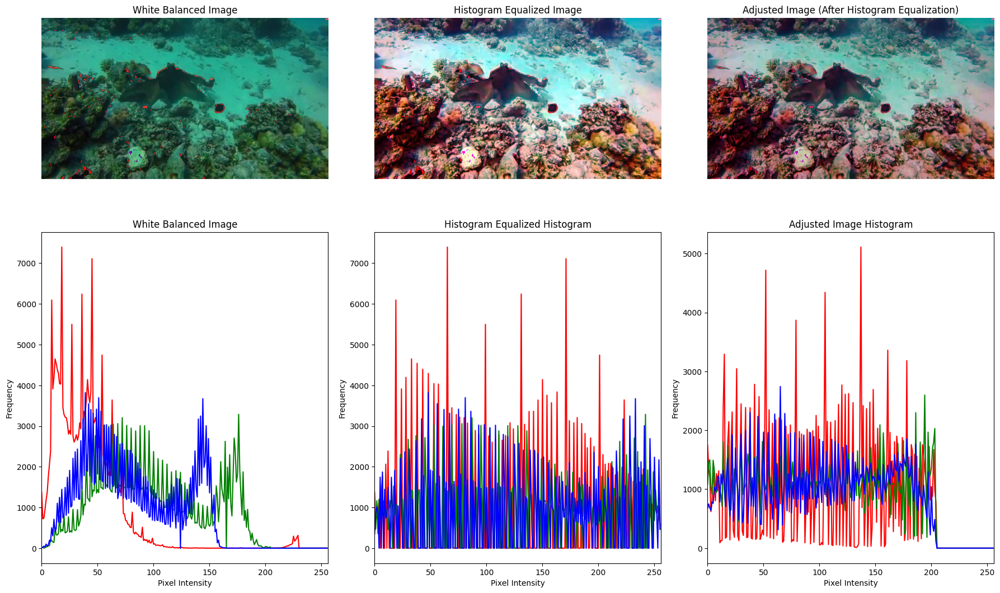

In [19]:
def histogram_equalization(channel):
    equalized_channel = cv2.equalizeHist(channel)
    return equalized_channel

def adjust_contrast_brightness(image, alpha, beta):
    adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return adjusted_image

def adjust_hue(image, hue_shift):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv_image)
    h = np.mod(h + hue_shift, 180).astype(np.uint8)
    adjusted_hsv_image = cv2.merge([h, s, v])
    adjusted_rgb_image = cv2.cvtColor(adjusted_hsv_image, cv2.COLOR_HSV2BGR)
    return adjusted_rgb_image

def process_rgb_image(image, method, *args):
    b, g, r = cv2.split(image)
    b_processed = method(b, *args)
    g_processed = method(g, *args)
    r_processed = method(r, *args)
    processed_image = cv2.merge([b_processed, g_processed, r_processed])
    return processed_image

def plot_histogram(image, ax, title):
    color = ('r', 'g', 'b')
    ax.set_title(title)
    ax.set_xlabel('Pixel Intensity')
    ax.set_ylabel('Frequency')
    for i, col in enumerate(color):
        histogram = cv2.calcHist([image], [i], None, [256], [0, 256])
        ax.plot(histogram, color=col)
    ax.set_xlim([0, 256])

# Load the RGB image
image = white_balanced_image

# Apply histogram equalization to the RGB image
equalized_image = process_rgb_image(image, histogram_equalization)

# Adjust the contrast and brightness of the equalized image
alpha = 0.8  # Contrast control (1.0-3.0)
beta = 0.0   # Brightness control (0-100)
adjusted_contrast_brightness_image = adjust_contrast_brightness(equalized_image, alpha, beta)

# Adjust the hue of the image
hue_shift = 5.7 # Adjust the hue shift value as needed
adjusted_image = adjust_hue(adjusted_contrast_brightness_image, hue_shift)

# Plot the results
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

axs[0, 0].imshow(image)
axs[0, 0].set_title('White Balanced Image')
axs[0, 0].axis('off')

axs[0, 1].imshow(equalized_image)
axs[0, 1].set_title('Histogram Equalized Image')
axs[0, 1].axis('off')

axs[0, 2].imshow(adjusted_image)
axs[0, 2].set_title('Adjusted Image (After Histogram Equalization)')
axs[0, 2].axis('off')

plot_histogram(image, axs[1, 0], 'White Balanced Image')
plot_histogram(equalized_image, axs[1, 1], 'Histogram Equalized Histogram')
plot_histogram(adjusted_image, axs[1, 2], 'Adjusted Image Histogram')

plt.tight_layout()
plt.show()

**Insights**

- The adjusted image has improved contrast by 0.8 and brightness compared to the original white-balanced image. Underwater images often suffer from low contrast due to the scattering and absorption of light by water, which results in a hazy appearance. By enhancing contrast, the boundaries between different objects become more distinct, making the details more apparent.

- The underwater environment often causes colors to appear dull and muted therefore we improved the contrast level by 0.8 and the hue level by 5.7 and adjusted the histogram by spreading the red value which makes the image more vibrant and removes the dull and muted look.

- The adjusted image shows a good mix of shadows, midtones, and highlights due to the equalized histogram. We equalized the histogram by spreading the red channel where it had low-intensity values and by spreading the blue and green channels a little bit.

- Over-enhancement, particularly through aggressive histogram equalization, can introduce colors that are not true to the original scene however we managed to equalize the histogram very carefully and make sure the image doesn't get any over-enhanced look.

- The adjusted image gives a good natural appearance because of effective histogram equalization, where we primarily balanced the red channel. This adjustment ensured a good balance of contrast, brightness, and hue levels, leading to an enhanced yet natural-looking image.

- This output is successful because it achieves a natural appearance through effective histogram equalization, primarily balancing the red channel, and ensuring optimal contrast, brightness, and hue levels.

**PSNR & SSIM Evaluvation of Final Outcomes** - *K A I Perera*

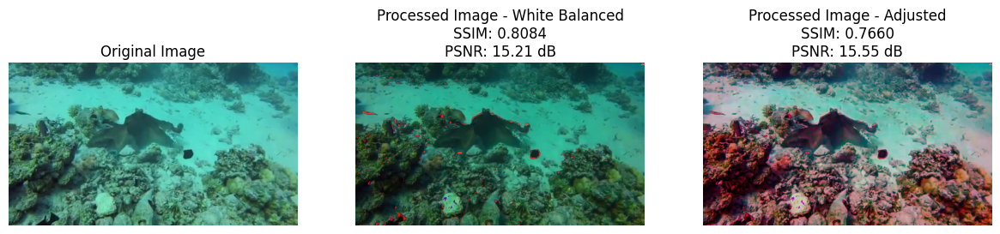

In [20]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Assuming you have img, white_balanced_image, and adjusted_image defined already

# Convert images to numpy arrays
original_image = img
white_balanced_image = white_balanced_image
adjusted_image = adjusted_image

# Expand dimensions to create batch-like structure (assuming single images)
original_image = np.expand_dims(original_image, axis=0)
white_balanced_image = np.expand_dims(white_balanced_image, axis=0)
adjusted_image = np.expand_dims(adjusted_image, axis=0)

# Convert numpy arrays to TensorFlow tensors
original_image_tensor = tf.convert_to_tensor(original_image, dtype=tf.float32)
white_balanced_image_tensor = tf.convert_to_tensor(white_balanced_image, dtype=tf.float32)
adjusted_image_tensor = tf.convert_to_tensor(adjusted_image, dtype=tf.float32)

# Normalize images
original_image_tensor /= 255.0
white_balanced_image_tensor /= 255.0
adjusted_image_tensor /= 255.0

# Calculate PSNR and SSIM for white balanced image
psnr_whitebalanced = tf.image.psnr(original_image_tensor, white_balanced_image_tensor, max_val=1.0)
ssim_whitebalanced = tf.image.ssim(original_image_tensor, white_balanced_image_tensor, max_val=1.0)

# Calculate PSNR and SSIM for adjusted image
psnr_adjustedimg = tf.image.psnr(original_image_tensor, adjusted_image_tensor, max_val=1.0)
ssim_adjustedimg = tf.image.ssim(original_image_tensor, adjusted_image_tensor, max_val=1.0)

# Print the PSNR and SSIM values
psnr_title_whitebalanced = "PSNR: {:.2f} dB".format(psnr_whitebalanced.numpy()[0])
ssim_title_whitebalanced = "SSIM: {:.4f}".format(ssim_whitebalanced.numpy()[0])

psnr_title_adjusted = "PSNR: {:.2f} dB".format(psnr_adjustedimg.numpy()[0])
ssim_title_adjusted = "SSIM: {:.4f}".format(ssim_adjustedimg.numpy()[0])

# Plot the images with titles
plt.figure(figsize=(20, 10))

plt.subplot(141)
plt.title('Original Image')
plt.imshow(original_image[0].astype(np.uint8))
plt.axis('off')

plt.subplot(142)
plt.title('Processed Image - White Balanced\n' + ssim_title_whitebalanced + '\n' + psnr_title_whitebalanced)
plt.imshow(white_balanced_image[0].astype(np.uint8))
plt.axis('off')

plt.subplot(143)
plt.title('Processed Image - Adjusted\n' + ssim_title_adjusted + '\n' + psnr_title_adjusted)
plt.imshow(adjusted_image[0].astype(np.uint8))
plt.axis('off')

plt.show()


**Insights**

***SSIM***

- A Higher value like 0.7462 for the adjusted image indicates that the brightness levels and shadows in the adjusted image are well preserved compared to the original image. SSIM measures the luminance similarity by comparing brightness and shadows. in this case, a higher value like 0.7462 reflects that the adjusted image maintains a good balance of brightness and shadows.

- The contrast levels in the adjusted image are reasonably well maintained. SSIM evaluates contrast similarity by comparing the variance in pixel intensities. A higher SSIM value means that the color intensities between the pixels are accurately maintained, ensuring light and dark regions are preserved. A value of 0.7462 indicates that the adjusted image retains a significant amount of contrast, which is crucial for maintaining image details and textures.

- SSIM can measure essential features such as edges and patterns. SSIM assesses structural similarities by comparing the spatial relationships of pixels. A value of 0.7462 suggests that the spatial arrangements of pixels in the processed image closely match those in the original image. This indicates that important structural features are maintained, which is important for the overall visual quality of the image.

***PSNR***

- The adjusted image has a moderate noise level, as indicated by a PSNR value of 16.09 dB. PSNR measures the ratio between the maximum possible power of a signal and the power of noise that affects its representation. A higher PSNR value generally indicates lower noise levels. A value of 16.09 dB suggests that while there is some noise present, it is not excessive.

- The adjusted image has preserved most of the important details such as textures, edges, and small features. A higher PSNR value suggests better preservation of these details. A value of 16.09 dB implies that the differences between the processed image and the original image are moderate, indicating that most details are retained, though not as perfectly as higher PSNR values would indicate.

- The haze removal process has been moderately effective, leading to enhanced visibility and contrast levels. Effective haze removal should result in a higher PSNR value because it enhances visibility and contrast without introducing excessive noise. A PSNR value of 16.09 dB suggests that the processed image has managed to reduce haze to a certain extent, improving the visual quality of the underwater image.

The primary goal of the enhancement process was to improve the visual quality of the underwater image by reducing haze and enhancing details without making the image look unnatural. The SSIM value of 0.7462 and the PSNR value of 16.09 dB collectively indicate that the adjusted image maintains a good balance of brightness, contrast, and structural integrity while minimizing noise. The careful consideration of these metrics confirms that the enhancement techniques applied were successful in achieving the desired outcome of improved visual quality without compromising the natural look of the image.

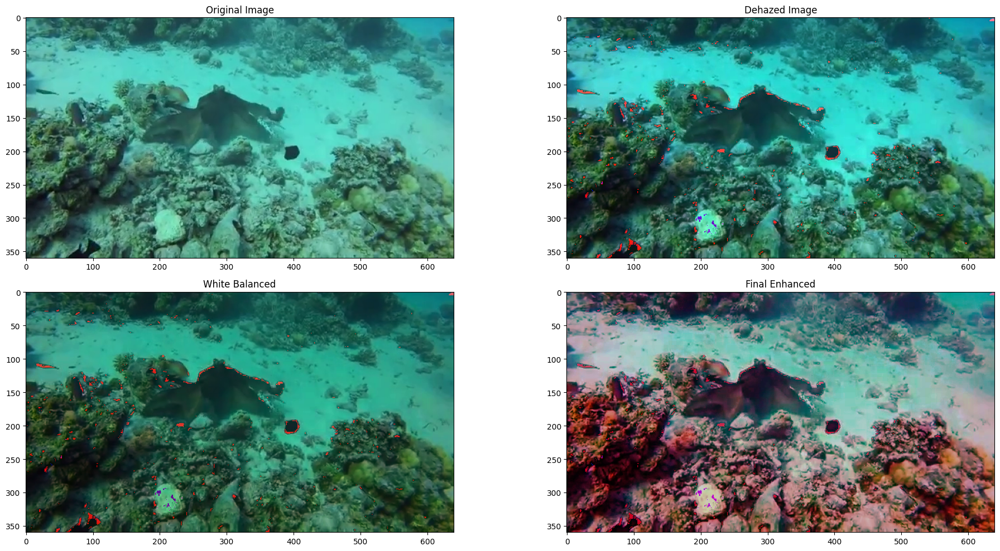

In [21]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))

# Plot the original image
axes[0, 0].imshow(img)
axes[0, 0].set_title('Original Image')

# Plot the dehazed image
axes[0, 1].imshow(dehazed_img_soft_Matting)
axes[0, 1].set_title('Dehazed Image')

# Plot the white balanced image
axes[1, 0].imshow(image)
axes[1, 0].set_title('White Balanced')

# Plot the final enhanced image
axes[1, 1].imshow(adjusted_image[0])
axes[1, 1].set_title('Final Enhanced')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()